# Miniproyecto: Seoul Bike Sharing Demand Dataset

Para este miniproyecto tipo Tensorflow-Keras, se hace uso del dataset <b>"South Korea Public Holidays"</b> ubicado en la plataforma <b>UCI Machine Learning Repository.</b> Este dataset consiste en el recuento de las bicicletas públicas alquiladas en cada hora en el sistema de alquiler de bicicletas de Seúl con la datos meteorológicos correspondientes e información sobre las vacaciones. Con base a la documentación del repositorio, se encuentran 8760 datos y 14 atributos diferentes. A partir de esto, se cuenta con un problema de regresión que tiene como objetivo predecir el número de bicicletas necesarias por hora para el suministro estable de bicicletas de alquiler.


# Parte 1

### Se importan las librerías


A continuación, hacemos uso de pandas para cargar la información del dataset en formato .csv, numpy para la manipulación de arreglos, matplotlib para gráficar y seaborn para obtener herramientas como pairplot y heatmap para el análisis completo de la correlación que existe entre los datos.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn

###Se carga del dataset

<p align="justify">

Se lee el archivo CSV (Comma Separated Values) y se crea un DataFrame de Pandas a partir de los datos del archivo. El parámetro encoding especifica la codificación de caracteres que se utiliza para leer el archivo CSV. En este caso, la codificación especificada es cp1252, que es una codificación de caracteres comúnmente utilizada en los sistemas Windows en Europa occidental.
  </font>
<p>

In [ ]:
data = pd.read_csv('/content/SeoulBikeData.csv',encoding='cp1252')
print(data.shape)
data.head(10)

(8760, 14)


,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.00,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.00,0.0,0.0,Winter,No Holiday,Yes
5,01/12/2017,100,5,-6.4,37,1.5,2000,-18.7,0.00,0.0,0.0,Winter,No Holiday,Yes
6,01/12/2017,181,6,-6.6,35,1.3,2000,-19.5,0.00,0.0,0.0,Winter,No Holiday,Yes
7,01/12/2017,460,7,-7.4,38,0.9,2000,-19.3,0.00,0.0,0.0,Winter,No Holiday,Yes
8,01/12/2017,930,8,-7.6,37,1.1,2000,-19.8,0.01,0.0,0.0,Winter,No Holiday,Yes
9,01/12/2017,490,9,-6.5,27,0.5,1928,-22.4,0.23,0.0,0.0,Winter,No Holiday,Yes


<p align="justify">
  <font face="Arial Narrow" size="4" color="#3c3c3c"> 
  Mediante el metodo describe, se obtienen información estadistica como la cantidad de datos, el promedio, el valor mínimo, entre otros por cada uno de los atributos que lo permiten.
  </font>
<p>

In [ ]:
data.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


<p align="justify">
  <font face="Arial Narrow" size="4" color="#3c3c3c"> 
  Se modfica el nombre de las columnas, de forma que sea más facil acceder a cada una de ellas, es decir, eliminando aspectos como su unidad y las mayusculas presentes.
  </font>
<p>

In [ ]:
data.columns = ['date','rented bike','hour','temperature','humidity','wind speed','visibility','dew point temperature','solar radiation','rainfall','snowfall', 'seasons',	'holiday',	'functioning day']
data.head(10)

,date,rented bike,hour,temperature,humidity,wind speed,visibility,dew point temperature,solar radiation,rainfall,snowfall,seasons,holiday,functioning day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.00,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.00,0.0,0.0,Winter,No Holiday,Yes
5,01/12/2017,100,5,-6.4,37,1.5,2000,-18.7,0.00,0.0,0.0,Winter,No Holiday,Yes
6,01/12/2017,181,6,-6.6,35,1.3,2000,-19.5,0.00,0.0,0.0,Winter,No Holiday,Yes
7,01/12/2017,460,7,-7.4,38,0.9,2000,-19.3,0.00,0.0,0.0,Winter,No Holiday,Yes
8,01/12/2017,930,8,-7.6,37,1.1,2000,-19.8,0.01,0.0,0.0,Winter,No Holiday,Yes
9,01/12/2017,490,9,-6.5,27,0.5,1928,-22.4,0.23,0.0,0.0,Winter,No Holiday,Yes


### Se verifican posibles valores nulos

<p align="justify">
  Se verifica si existen datos nulos, y cuántos en caso de que existan. Se obtiene que no existen datos nulos en alguno de los atributos.
  </font>
<p>

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   date                   8760 non-null   object 
 1   rented bike            8760 non-null   int64  
 2   hour                   8760 non-null   int64  
 3   temperature            8760 non-null   float64
 4   humidity               8760 non-null   int64  
 5   wind speed             8760 non-null   float64
 6   visibility             8760 non-null   int64  
 7   dew point temperature  8760 non-null   float64
 8   solar radiation        8760 non-null   float64
 9   rainfall               8760 non-null   float64
 10  snowfall               8760 non-null   float64
 11  seasons                8760 non-null   object 
 12  holiday                8760 non-null   object 
 13  functioning day        8760 non-null   object 
dtypes: float64(6), int64(4), object(4)
memory usage: 958.2+ 

In [ ]:
data.isnull().sum()

date                     0
rented bike              0
hour                     0
temperature              0
humidity                 0
wind speed               0
visibility               0
dew point temperature    0
solar radiation          0
rainfall                 0
snowfall                 0
seasons                  0
holiday                  0
functioning day          0
dtype: int64

### Se eliminan parámetros innecesarios

<p align="justify">
 Los datos se revisan para identificar las variables de tipo String y Date, las cuales son eliminadas en una primera instancia. Luego, se realiza un análisis de las variables restantes y se encuentra que la mayoría de los datos en la variable Holiday (Holiday:8328 y No Holiday:432) y Functiong Day (Yes:8465 y No:295) presentan un único valor, mientras que en la variable Season (Winter: 2160, Spring: 2208, Summer: 2208 y Autumn: 2184) los datos se encuentran distribuidos uniformemente. Por lo tanto, se les asigna un entero de 0 a 3 utilizando el método .to_numeric() de pandas para convertir de objeto a número la respectiva columna. Finalmente, se observa que la mayoría de los datos en la variable Rainfall (8232 datos en 0.0) y Snowfall (8317 datos en 0.0) están en cero, por lo que se decide eliminar estas variables de los datos y se grafican los histogramas para corroborar los resultados.
  </font>
</p>
<p align="justify">
  <font face="Arial Narrow" size="4" color="#3c3c3c"> 
  Season: Winter: 0, Spring: 1, Summer: 2, Autunum: 3
  </font>
</p>

In [ ]:
data = data.drop(['date'], axis=1)

In [ ]:
print(pd.value_counts(np.array(data['functioning day'])))
print(" ")
print(pd.value_counts(np.array(data['holiday'])))
print(" ")
print(pd.value_counts(np.array(data['seasons'])))

Yes    8465
No      295
dtype: int64
 
No Holiday    8328
Holiday        432
dtype: int64
 
Spring    2208
Summer    2208
Autumn    2184
Winter    2160
dtype: int64


In [ ]:
data['seasons'][data['seasons'] == 'Winter'] = 0
data['seasons'][data['seasons'] == 'Spring'] = 1
data['seasons'][data['seasons'] == 'Summer'] = 2
data['seasons'][data['seasons'] == 'Autumn'] = 3

<ipython-input-9-65356e09ba30>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['seasons'][data['seasons'] == 'Winter'] = 0
<ipython-input-9-65356e09ba30>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['seasons'][data['seasons'] == 'Spring'] = 1
<ipython-input-9-65356e09ba30>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['seasons'][data['seasons'] == 'Summer'] = 2
<ipython-input-9-65356e09ba30>:4: SettingWithCopyWar

In [ ]:
data['seasons'] = pd.to_numeric(data['seasons'])
print(data.dtypes)

rented bike                int64
hour                       int64
temperature              float64
humidity                   int64
wind speed               float64
visibility                 int64
dew point temperature    float64
solar radiation          float64
rainfall                 float64
snowfall                 float64
seasons                    int64
holiday                   object
functioning day           object
dtype: object


In [ ]:
data = data.drop(['holiday','functioning day'], axis=1)

array([[<AxesSubplot:title={'center':'rented bike'}>,
        <AxesSubplot:title={'center':'hour'}>,
        <AxesSubplot:title={'center':'temperature'}>],
       [<AxesSubplot:title={'center':'humidity'}>,
        <AxesSubplot:title={'center':'wind speed'}>,
        <AxesSubplot:title={'center':'visibility'}>],
       [<AxesSubplot:title={'center':'dew point temperature'}>,
        <AxesSubplot:title={'center':'solar radiation'}>,
        <AxesSubplot:title={'center':'rainfall'}>],
       [<AxesSubplot:title={'center':'snowfall'}>,
        <AxesSubplot:title={'center':'seasons'}>, <AxesSubplot:>]],
      dtype=object)

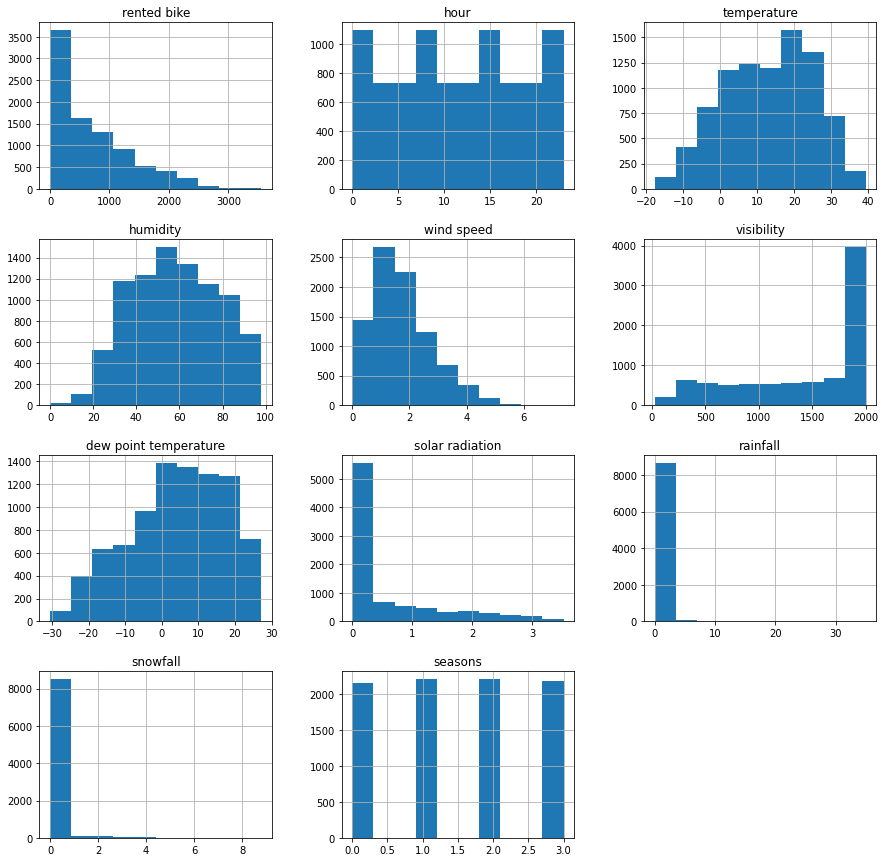

In [ ]:
data.hist(figsize=(15,15))

In [ ]:
count = np.count_nonzero(data['rainfall']==0.0)
print('rainfall = 0 ->', count)
count = np.count_nonzero(data['snowfall']==0.0)
print('snowfall = 0 ->', count)

rainfall = 0 -> 8232
snowfall = 0 -> 8317


In [ ]:
data = data.drop(['rainfall', 'snowfall'], axis=1)

# Parte 2


### Normalización de los datos

<p align="justify">
Con el fin de obtener una mejor distribución de los datos y comparación más acertada, se realiza la normalización de los mismos entre los valores de -1 y 1.
También hace que los datos sean más comparables y manejables.
  </font>
</p>

In [ ]:
def normalizar(x,xmax,xmin,ymax,ymin):
  m = (ymax-ymin)/(xmax-xmin)
  b = ymin - m*xmin
  y = m*x + b
  
  return y

In [ ]:
max = np.max(data).values
min = np.min(data).values
data2 = normalizar(data,max,min,1,-1)
data2.head(10)

,rented bike,hour,temperature,humidity,wind speed,visibility,dew point temperature,solar radiation,seasons
0,-0.857143,-1.000000,-0.559441,-0.244898,-0.405405,1.000000,-0.550173,-1.000000,-1.0
1,-0.885264,-0.913043,-0.569930,-0.224490,-0.783784,1.000000,-0.550173,-1.000000,-1.0
2,-0.902700,-0.826087,-0.587413,-0.204082,-0.729730,1.000000,-0.553633,-1.000000,-1.0
3,-0.939820,-0.739130,-0.594406,-0.183673,-0.756757,1.000000,-0.550173,-1.000000,-1.0
4,-0.956130,-0.652174,-0.587413,-0.265306,-0.378378,1.000000,-0.584775,-1.000000,-1.0
5,-0.943757,-0.565217,-0.601399,-0.244898,-0.594595,1.000000,-0.588235,-1.000000,-1.0
6,-0.898200,-0.478261,-0.608392,-0.285714,-0.648649,1.000000,-0.615917,-1.000000,-1.0
7,-0.741282,-0.391304,-0.636364,-0.224490,-0.756757,1.000000,-0.608997,-1.000000,-1.0
8,-0.476940,-0.304348,-0.643357,-0.244898,-0.702703,1.000000,-0.626298,-0.994318,-1.0
9,-0.724409,-0.217391,-0.604895,-0.448980,-0.864865,0.927015,-0.716263,-0.869318,-1.0


### Análisis de la correlación de los atributos

<p align="justify">
  Se utilizaron las herramientas de seaborn para crear gráficas de cada atributo del dataset con respecto a los demás, lo que permitió analizar la correlación entre los atributos y también entre los atributos y la variable de salida. A continuación, se calcularon los factores de correlación para cada relación y se representaron en un mapa de calor. En este mapa se observó una correlación directa entre la temperatura, la hora y la cantidad de bicicletas rentadas. Además, se notó que los atributos relacionados con la temperatura mostraban una correlación entre ellos, lo cual no es del todo positivo ya que se esperaría que las entradas fueran diferentes entre sí.
  </font>
</p>

In [ ]:
sn.pairplot(data2)

Output hidden; open in https://colab.research.google.com to view.

En las partes triangulares se muestran los gráficos de dispersión de cada par de variables en el conjunto de datos. Cada punto en el gráfico representa un valor de las dos variables correspondientes y la ubicación de los puntos en el gráfico puede revelar patrones o tendencias en la relación entre las variables.

En la línea diagonal de la gráfica de pairplot, se muestran los histogramas o gráficos de densidad de cada variable individual en el conjunto de datos.

In [ ]:
corr = data2.corr()
print(corr)

                       rented bike          hour  temperature  humidity  \
rented bike               1.000000  4.102573e-01     0.538558 -0.199780   
hour                      0.410257  1.000000e+00     0.124114 -0.241644   
temperature               0.538558  1.241145e-01     1.000000  0.159371   
humidity                 -0.199780 -2.416438e-01     0.159371  1.000000   
wind speed                0.121108  2.851967e-01    -0.036252 -0.336683   
visibility                0.199280  9.875348e-02     0.034794 -0.543090   
dew point temperature     0.379788  3.054372e-03     0.912798  0.536894   
solar radiation           0.261837  1.451309e-01     0.353505 -0.461919   
seasons                   0.359687  3.514423e-18     0.591545  0.189238   

                       wind speed  visibility  dew point temperature  \
rented bike              0.121108    0.199280               0.379788   
hour                     0.285197    0.098753               0.003054   
temperature             -0.036252

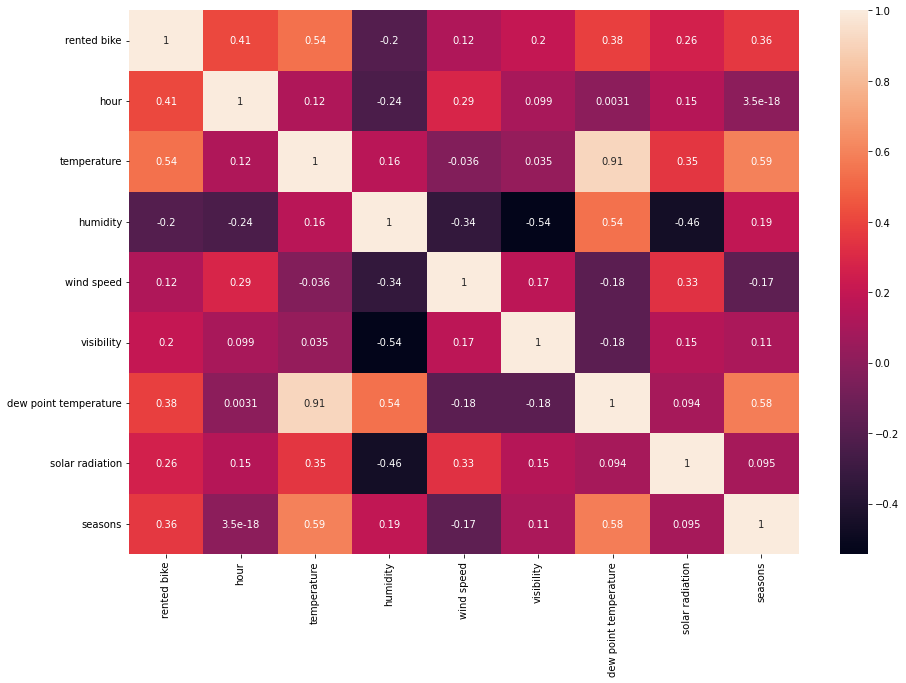

In [ ]:
plt.figure(figsize=(15,10))
sn.heatmap(corr, annot=True)
plt.show()

### Generación del Modelo

<p align="justify">
Para la generación del modelo, se estableció como requerimiento el planteamiento de tres arquitecturas diferentes y tres optimizadores diferentes. Se inició un proceso de documentación acerca de los optimizadores disponibles en Keras, entre los cuales se seleccionaron Adam, Nadam y Adamax, que son variaciones del optimizador Adam. A partir de los optimizadores seleccionados, se plantearon tres arquitecturas diferentes, identificadas como Primera arquitectura, Segunda arquitectura y Tercera arquitectura. Posteriormente, se definieron los procesos de entrenamiento de la red para llevar a cabo un análisis final de las arquitecturas y los optimizadores utilizados.
  </font>
</p>

#### Importación de librerías para el modelo

<p align="justify">
Se importaron las librerías de TensorFlow y Keras para crear, entrenar y validar el modelo o arquitectura de red neuronal. Para llevar a cabo esta tarea, se utilizó el método Sequential con el objetivo de definir el tipo de red, Dense para generar o crear capas densas y plot_model para graficar el modelo.
  </font>
<p>

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import plot_model

#### Abstracción de los datos de entrenamiento y validación

<p align="justify">
  Se realizaron dos procesos fundamentales para la abstracción de los datos de entrenamiento y validación. El primer proceso consistió en separar el target, es decir, la salida, de las entradas. Esto se logró mediante la abstracción de la columna "rented bike" como salida y la eliminación de este atributo del dataset para las entradas. El segundo proceso correspondió a la separación de los datos de entrenamiento y validación. Para ello, se utilizó la función train_test_split de la biblioteca sklearn, que permitió separar los datos de validación del 30% de los datos restantes.
  </font>
<p>

In [ ]:
target = data2['rented bike'].values #y_train
data3 = data2.drop(['rented bike'], axis=1)

print(target.shape)
print(data3.shape)

(8760,)
(8760, 8)


In [ ]:
from sklearn.model_selection import train_test_split
seed = 42

x_train,x_test,y_train,y_test = train_test_split(data3, target, test_size=0.3, random_state=seed)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(6132, 8)
(6132,)
(2628, 8)
(2628,)


# Parte 3

#### Arquitecturas del modelo

<p align="justify">
  Se presentan <b>3 arquitecturas diferentes</b> para el modelo de red neuronal, con variaciones en el número de neuronas y capas profundas permitidas, limitando estas últimas a un máximo de 3. Además, para cada una de estas arquitecturas se implementan <b>3 optimizadores diferentes</b>, siendo estos <b>Adamax</b>, <b>Nadam</b> y <b>Adam</b>.
  </font>
</p>

In [ ]:
input_dim = x_train.shape[1]
num_clases = 1

##### Primera arquitectura

<p align="justify">
  La primera arquitectura está conformada por 1 capa de entrada, 1 capa oculta de 10 neuronas, con función de activación ReLU y una capa de salida de una sola neurona con función de activación lineal.
  </font>
</p>

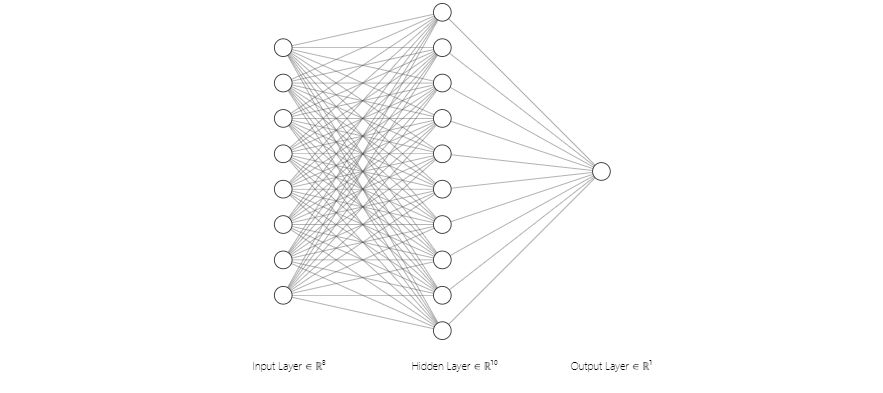

###### Adam

In [ ]:
def model_Adam():
  model = Sequential()
  model.add(Dense(10, input_dim = input_dim, activation='relu'))
  model.add(Dense(num_clases, activation='linear'))

  model.summary()
  opt = tf.keras.optimizers.Adam(learning_rate=0.001)
  model.compile(loss = 'mse', optimizer = opt)

  return model

In [ ]:
modelA1_Adam = model_Adam()
#plot_model(modelA1_Adam, to_file='model.jpg', show_shapes=True)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 10)                90        
                                                                 
 dense_1 (Dense)             (None, 1)                 11        
                                                                 
Total params: 101
Trainable params: 101
Non-trainable params: 0
_________________________________________________________________


###### Nadam

In [ ]:
def model_Nadam():
  model = Sequential()
  model.add(Dense(10, input_dim = input_dim, activation='relu'))
  model.add(Dense(num_clases, activation='linear'))
  model.summary()

  opt = tf.keras.optimizers.Nadam(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Nadam")
  
  model.compile(loss = 'mse', optimizer = opt)
  return model

In [ ]:
modelA1_Nadam = model_Nadam()
#plot_model(modelA1_Nadam, to_file='model.jpg', show_shapes=True)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 10)                90        
                                                                 
 dense_3 (Dense)             (None, 1)                 11        
                                                                 
Total params: 101
Trainable params: 101
Non-trainable params: 0
_________________________________________________________________


###### Adamax

In [ ]:
def model_Adamax():
  model = Sequential()
  model.add(Dense(10, input_dim = input_dim, activation='relu'))
  model.add(Dense(num_clases, activation='linear'))
  model.summary()

  opt =tf.keras.optimizers.Adamax(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Adamax")
 
  model.compile(loss = 'mse', optimizer = opt)
  return model

In [ ]:
modelA1_Adamax = model_Adamax()
#plot_model(modelA1_Adamax, to_file='model.jpg', show_shapes=True)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 10)                90        
                                                                 
 dense_5 (Dense)             (None, 1)                 11        
                                                                 
Total params: 101
Trainable params: 101
Non-trainable params: 0
_________________________________________________________________


##### Segunda arquitectura

<p align="justify">
  La segunda arquitectura está conformada por 1 capa de entrada, 2 capas ocultas de 10 neuronas, con función de activación ReLU y una capa de salida de una sola neurona con función de activación lineal.
  </font>
</p>

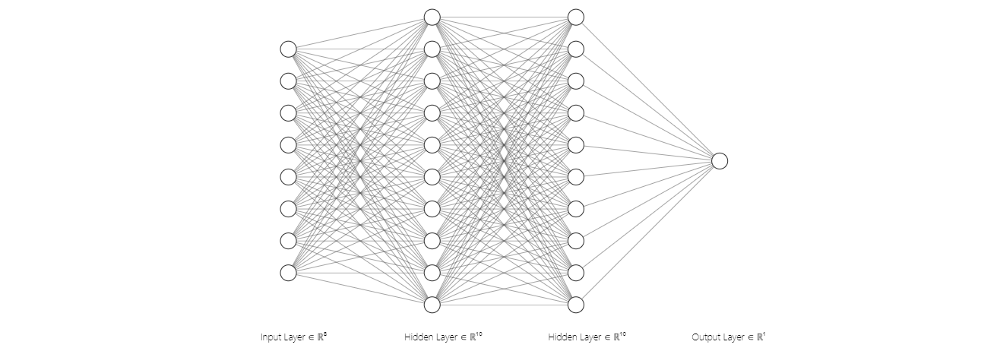

###### Adam

In [ ]:
def model_Adam():
  model = Sequential()
  model.add(Dense(10, input_dim = input_dim, activation='relu'))
  model.add(Dense(10, activation='relu'))
  model.add(Dense(num_clases, activation='linear'))

  model.summary()

  opt = tf.keras.optimizers.Adam(learning_rate=0.001)
 
  model.compile(loss = 'mse', optimizer = opt)

  return model

In [ ]:
modelA2_Adam = model_Adam()
#plot_model(modelA2_Adam, to_file='model.jpg', show_shapes=True)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 10)                90        
                                                                 
 dense_7 (Dense)             (None, 10)                110       
                                                                 
 dense_8 (Dense)             (None, 1)                 11        
                                                                 
Total params: 211
Trainable params: 211
Non-trainable params: 0
_________________________________________________________________


###### Nadam

In [ ]:
def model_Nadam():
  model = Sequential()
  model.add(Dense(10, input_dim = input_dim, activation='relu'))
  model.add(Dense(10, activation='relu'))
  model.add(Dense(num_clases, activation='linear'))

  model.summary()

  opt = tf.keras.optimizers.Nadam(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Nadam"
)
 
  model.compile(loss = 'mse', optimizer = opt)

  return model

In [ ]:
modelA2_Nadam = model_Nadam()
#plot_model(modelA2_Nadam, to_file='model.jpg', show_shapes=True)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 10)                90        
                                                                 
 dense_10 (Dense)            (None, 10)                110       
                                                                 
 dense_11 (Dense)            (None, 1)                 11        
                                                                 
Total params: 211
Trainable params: 211
Non-trainable params: 0
_________________________________________________________________


###### Adamax

In [ ]:
def model_Adamax():
  model = Sequential()
  model.add(Dense(10, input_dim = input_dim, activation='relu'))
  model.add(Dense(10, activation='relu'))
  model.add(Dense(num_clases, activation='linear'))

  model.summary()

  opt =tf.keras.optimizers.Adamax(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Adamax"
)
 
  model.compile(loss = 'mse', optimizer = opt)

  return model

In [ ]:
modelA2_Adamax = model_Adamax()
#plot_model(modelA2_Adamax, to_file='model.jpg', show_shapes=True)

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 10)                90        
                                                                 
 dense_13 (Dense)            (None, 10)                110       
                                                                 
 dense_14 (Dense)            (None, 1)                 11        
                                                                 
Total params: 211
Trainable params: 211
Non-trainable params: 0
_________________________________________________________________


##### Tercera arquitectura

<p align="justify">
  La tercer y última arquitectura se compone de 1 capa de entrada, 2 capas ocultas de 32 y 16 neuronas respectivamente, con función de activación ReLU y una capa de salida de una sola neurona con función de activación lineal.
  </font>
</p>

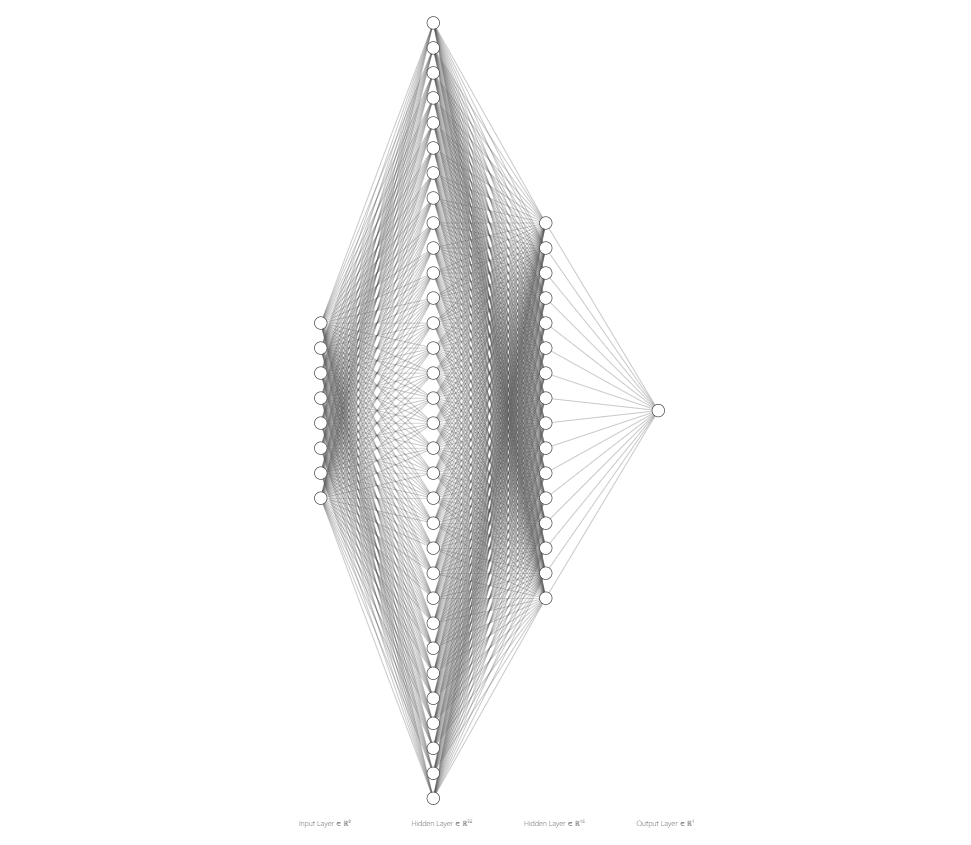

###### Adam

In [ ]:
def model_Adam():
  model = Sequential()
  model.add(Dense(32, input_dim = input_dim, activation='relu'))
  model.add(Dense(16, activation='relu'))
  model.add(Dense(num_clases, activation='linear'))

  model.summary()

  opt = tf.keras.optimizers.Adam(learning_rate=0.001)
 
  model.compile(loss = 'mse', optimizer = opt)

  return model

In [ ]:
modelA3_Adam = model_Adam()
#plot_model(modelA1_Adam, to_file='model.jpg', show_shapes=True)

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_15 (Dense)            (None, 32)                288       
                                                                 
 dense_16 (Dense)            (None, 16)                528       
                                                                 
 dense_17 (Dense)            (None, 1)                 17        
                                                                 
Total params: 833
Trainable params: 833
Non-trainable params: 0
_________________________________________________________________


###### Nadam

In [ ]:
def model_Nadam():
  model = Sequential()
  model.add(Dense(32, input_dim = input_dim, activation='relu'))
  model.add(Dense(16, activation='relu'))
  model.add(Dense(num_clases, activation='linear'))

  model.summary()

  opt = tf.keras.optimizers.Nadam(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Nadam"
)
 
  model.compile(loss = 'mse', optimizer = opt)

  return model

In [ ]:
modelA3_Nadam = model_Nadam()
#plot_model(modelA3_Nadam, to_file='model.jpg', show_shapes=True)

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_18 (Dense)            (None, 32)                288       
                                                                 
 dense_19 (Dense)            (None, 16)                528       
                                                                 
 dense_20 (Dense)            (None, 1)                 17        
                                                                 
Total params: 833
Trainable params: 833
Non-trainable params: 0
_________________________________________________________________


###### Adamax

In [ ]:
def model_Adamax():
  model = Sequential()
  model.add(Dense(32, input_dim = input_dim, activation='relu'))
  model.add(Dense(16, activation='relu'))
  model.add(Dense(num_clases, activation='linear'))

  model.summary()

  opt =tf.keras.optimizers.Adamax(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Adamax"
)
 
  model.compile(loss = 'mse', optimizer = opt)

  return model

In [ ]:
modelA3_Adamax = model_Adamax()
#plot_model(modelA3_Adamax, to_file='model.jpg', show_shapes=True)

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_21 (Dense)            (None, 32)                288       
                                                                 
 dense_22 (Dense)            (None, 16)                528       
                                                                 
 dense_23 (Dense)            (None, 1)                 17        
                                                                 
Total params: 833
Trainable params: 833
Non-trainable params: 0
_________________________________________________________________


# Parte 4

#### Entrenamiento y validación de los modelos

<p align="justify">
  Se hace uso de las funciones de perdida y el coeficiente de regresión para obtener una métrica del rendimiento del modelo. En esta sección se entrena cada una de las arquitecturas con cada uno de los optimizadores planteados en la sección de <b>arquitectura del modelo</b>. Además, se realiza una comparación de las predicciones por cada una de las arquitecturas para analizar cuál es el mejor optimizador para cada una. El entrenamiento se realiza durante un total de 250 épocas de forma general.
  </font>
<p>

##### Primera arquitectura


###### Adam

In [ ]:
history1 = modelA1_Adam.fit(x_train,y_train, validation_data=(x_test,y_test), epochs=250, batch_size=100, verbose=0)

In [ ]:
score1 = modelA1_Adam.evaluate(x_test, y_test, verbose=0)

print(score1)

0.0457192100584507


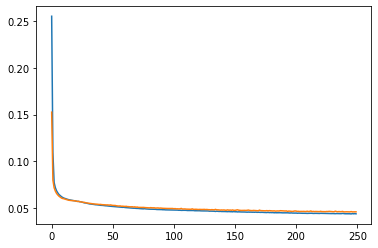

In [ ]:
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])

In [ ]:
outputTest_A1_Adam = modelA1_Adam.predict(x_test)
print(outputTest_A1_Adam.shape)

83/83 [==============================] - 0s 2ms/step
(2628, 1)


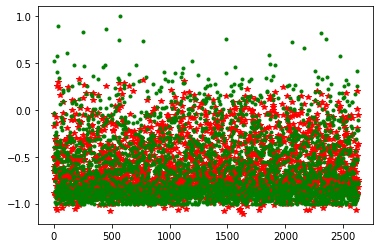

In [ ]:
plt.figure()
plt.plot(outputTest_A1_Adam, '*r',y_test, '.g')

In [ ]:
for i in range(0,10) :
  outputTest_A1_Adam_10pred =  modelA1_Adam.predict(np.reshape(np.array(x_test)[i],(1,8)))  
  print(outputTest_A1_Adam_10pred)

1/1 [==============================] - 0s 54ms/step
[[-0.49899247]]
1/1 [==============================] - 0s 25ms/step
[[-0.60794747]]
1/1 [==============================] - 0s 24ms/step
[[-0.5139269]]
1/1 [==============================] - 0s 29ms/step
[[-0.17632923]]
1/1 [==============================] - 0s 28ms/step
[[-0.88244516]]
1/1 [==============================] - 0s 24ms/step
[[-0.64894193]]
1/1 [==============================] - 0s 25ms/step
[[-0.04512044]]
1/1 [==============================] - 0s 22ms/step
[[-0.65504897]]
1/1 [==============================] - 0s 29ms/step
[[-0.5845835]]
1/1 [==============================] - 0s 27ms/step
[[-0.7376157]]


**Coeficiente de regresión**

(2628, 1)
(2628, 1)
Coeficiente:  0.6434374717574689


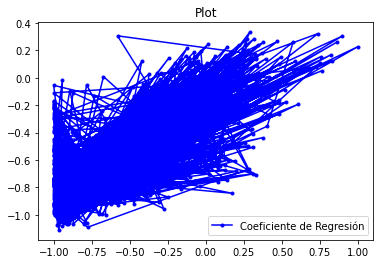

In [ ]:
from sklearn import linear_model

output = outputTest_A1_Adam
target = y_test.reshape([2628,1])

print(output.shape)
print(target.shape)

regr = linear_model.LinearRegression()

regr.fit(target, output)

coef = regr.coef_

print('Coeficiente: ', coef[0][0])

plt.figure()
plt.plot(target,output, '.-b', label = 'Coeficiente de Regresión')
plt.title('Plot')
plt.legend()
plt.show()

###### Nadam

In [ ]:
history2 = modelA1_Nadam.fit(x_train,y_train, validation_data=(x_test,y_test), epochs=250, batch_size=100, verbose=0)

In [ ]:
score2 = modelA1_Nadam.evaluate(x_test, y_test, verbose=0)

print(score2)

0.04528062790632248


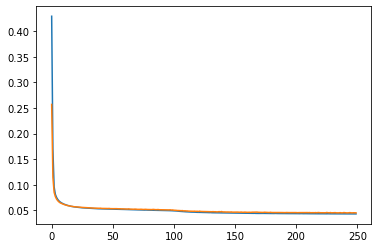

In [ ]:
plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])

In [ ]:
outputTest_A1_Nadam = modelA1_Nadam.predict(x_test)
print(outputTest_A1_Nadam.shape)

83/83 [==============================] - 0s 1ms/step
(2628, 1)


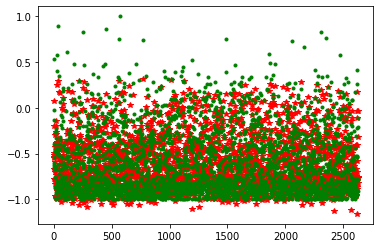

In [ ]:
plt.figure()
plt.plot(outputTest_A1_Nadam, '*r',y_test, '.g')

In [ ]:
for i in range(0,8) :
  outputTest_A1_Nadam_10pred =  modelA1_Nadam.predict(np.reshape(np.array(x_test)[i],(1,8)))  
  print(outputTest_A1_Nadam_10pred)

1/1 [==============================] - 0s 82ms/step
[[-0.5382426]]
1/1 [==============================] - 0s 31ms/step
[[-0.54876304]]
1/1 [==============================] - 0s 41ms/step
[[-0.51805633]]
1/1 [==============================] - 0s 30ms/step
[[-0.1997118]]
1/1 [==============================] - 0s 25ms/step
[[-0.779216]]
1/1 [==============================] - 0s 26ms/step
[[-0.6631822]]
1/1 [==============================] - 0s 26ms/step
[[0.07259303]]
1/1 [==============================] - 0s 27ms/step
[[-0.49105334]]


**Coeficiente de regresión**

(2628, 1)
(2628, 1)
Coeficiente:  0.6621721582461564


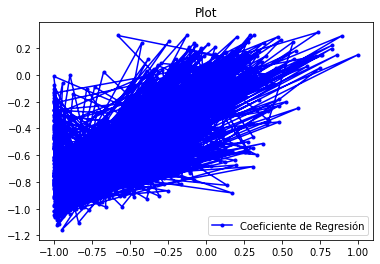

In [ ]:
from sklearn import linear_model

output = outputTest_A1_Nadam
target = y_test.reshape([2628,1])

print(output.shape)
print(target.shape)

regr = linear_model.LinearRegression()

regr.fit(target, output)

coef = regr.coef_

print('Coeficiente: ', coef[0][0])

plt.figure()
plt.plot(target,output, '.-b', label = 'Coeficiente de Regresión')
plt.title('Plot')
plt.legend()
plt.show()

###### Adamax

In [ ]:
history3 = modelA1_Adamax.fit(x_train,y_train, validation_data=(x_test,y_test), epochs=250, batch_size=100, verbose=0)

In [ ]:
score3 = modelA1_Adamax.evaluate(x_test, y_test, verbose=0)

print(score3)

0.05292991176247597


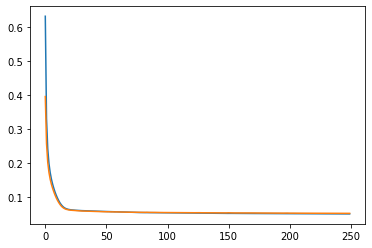

In [ ]:
plt.plot(history3.history['loss'])
plt.plot(history3.history['val_loss'])

In [ ]:
outputTest_A1_Adamax = modelA1_Adamax.predict(x_test)
print(outputTest_A1_Adamax.shape)

83/83 [==============================] - 0s 1ms/step
(2628, 1)


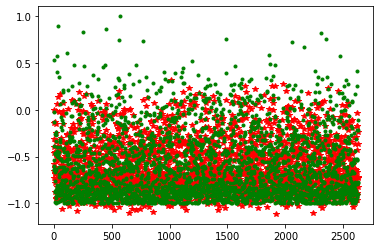

In [ ]:
plt.figure()
plt.plot(outputTest_A1_Adamax, '*r',y_test, '.g')

In [ ]:
for i in range(0,10) :
  outputTest_A1_Adamax_10pred =  modelA1_Adamax.predict(np.reshape(np.array(x_test)[i],(1,8)))  
  print(outputTest_A1_Adamax_10pred)

1/1 [==============================] - 0s 61ms/step
[[-0.5778278]]
1/1 [==============================] - 0s 27ms/step
[[-0.31258425]]
1/1 [==============================] - 0s 27ms/step
[[-0.3997494]]
1/1 [==============================] - 0s 24ms/step
[[-0.1381245]]
1/1 [==============================] - 0s 24ms/step
[[-0.7289208]]
1/1 [==============================] - 0s 27ms/step
[[-0.6590674]]
1/1 [==============================] - 0s 29ms/step
[[-0.00524604]]
1/1 [==============================] - 0s 28ms/step
[[-0.46728268]]
1/1 [==============================] - 0s 29ms/step
[[-0.62582725]]
1/1 [==============================] - 0s 33ms/step
[[-0.67520046]]


**Coeficiente de regresión**

(2628, 1)
(2628, 1)
Coeficiente:  0.5981536282876515


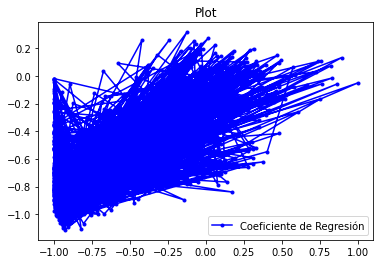

In [ ]:
from sklearn import linear_model

output = outputTest_A1_Adamax
target = y_test.reshape([2628,1])

print(output.shape)
print(target.shape)

regr = linear_model.LinearRegression()

regr.fit(target, output)

coef = regr.coef_

print('Coeficiente: ', coef[0][0])

plt.figure()
plt.plot(target,output, '.-b', label = 'Coeficiente de Regresión')
plt.title('Plot')
plt.legend()
plt.show()

###### Comparación

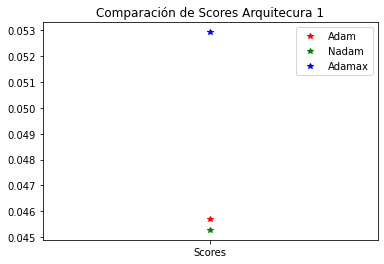

In [ ]:
plt.title('Comparación de Scores Arquitecura 1')
plt.plot("Scores",score1 ,'*r' ,label="Adam")
plt.plot("Scores",score2 ,'*g' ,label="Nadam")
plt.plot("Scores",score3 ,'*b',label="Adamax")
plt.legend()
plt.show()

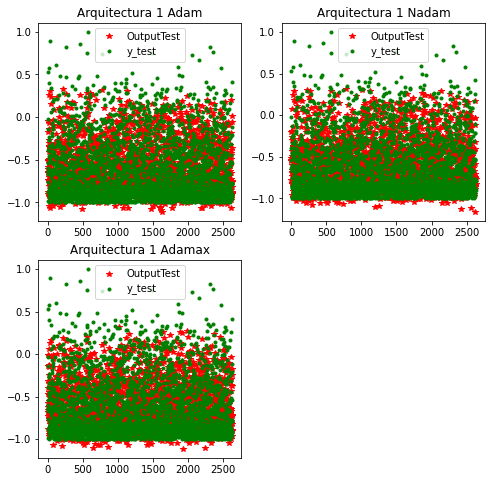

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 2, 1)

plt.title('Arquitectura 1 Adam')
plt.plot(outputTest_A1_Adam ,'*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(2, 2, 2)
plt.title('Arquitectura 1 Nadam')
plt.plot(outputTest_A1_Nadam, '*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(2, 2, 3)
plt.title('Arquitectura 1 Adamax')
plt.plot(outputTest_A1_Adamax, '*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

##### Segunda arquitectura

###### Adam

In [ ]:
history4 = modelA2_Adam.fit(x_train,y_train, validation_data=(x_test,y_test), epochs=250, batch_size=100, verbose=0)

In [ ]:
score4 = modelA2_Adam.evaluate(x_test, y_test, verbose=0)
print(score4)

0.03797873482108116


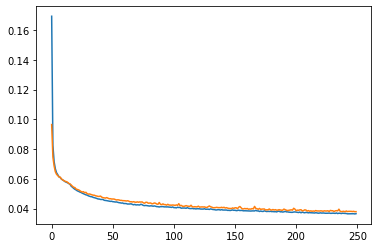

In [ ]:
plt.plot(history4.history['loss'])
plt.plot(history4.history['val_loss'])

In [ ]:
outputTest_A2_Adam = modelA2_Adam.predict(x_test)
print(outputTest_A2_Adam.shape)

83/83 [==============================] - 0s 2ms/step
(2628, 1)


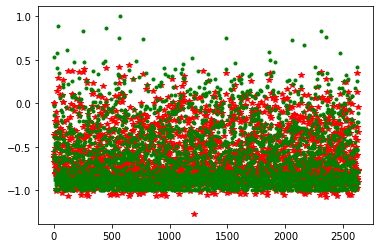

In [ ]:
plt.figure()
plt.plot(outputTest_A2_Adam, '*r',y_test, '.g')

In [ ]:
for i in range(0,10) :
  outputTest_A2_Adam_10pred =  modelA2_Adam.predict(np.reshape(np.array(x_test)[i],(1,8)))  
  print(outputTest_A2_Adam_10pred)

1/1 [==============================] - 0s 67ms/step
[[-0.36429217]]
1/1 [==============================] - 0s 28ms/step
[[-0.62126166]]
1/1 [==============================] - 0s 29ms/step
[[-0.5598543]]
1/1 [==============================] - 0s 32ms/step
[[-0.00219297]]
1/1 [==============================] - 0s 24ms/step
[[-0.6733233]]
1/1 [==============================] - 0s 25ms/step
[[-0.62339646]]
1/1 [==============================] - 0s 26ms/step
[[0.00549845]]
1/1 [==============================] - 0s 26ms/step
[[-0.59465086]]
1/1 [==============================] - 0s 29ms/step
[[-0.63257277]]
1/1 [==============================] - 0s 24ms/step
[[-0.688246]]


**Coeficiente de regresión**

(2628, 1)
(2628, 1)
Coeficiente:  0.7255553499010108


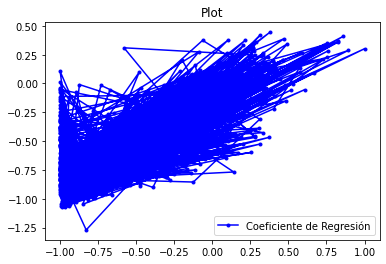

In [ ]:
from sklearn import linear_model

output = outputTest_A2_Adam
target = y_test.reshape([2628,1])

print(output.shape)
print(target.shape)

regr = linear_model.LinearRegression()

regr.fit(target, output)

coef = regr.coef_

print('Coeficiente: ', coef[0][0])

plt.figure()
plt.plot(target,output, '.-b', label = 'Coeficiente de Regresión')
plt.title('Plot')
plt.legend()
plt.show()

###### Nadam

In [ ]:
history5 = modelA2_Nadam.fit(x_train,y_train, validation_data=(x_test,y_test), epochs=250, batch_size=100, verbose=0)

In [ ]:
score5 = modelA2_Nadam.evaluate(x_test, y_test, verbose=0)

print(score5)

0.038486190140247345


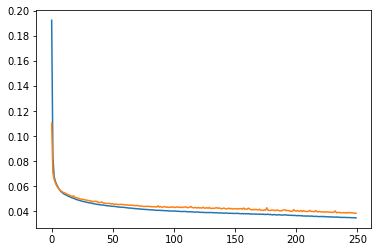

In [ ]:
plt.plot(history5.history['loss'])
plt.plot(history5.history['val_loss'])

In [ ]:
outputTest_A2_Nadam = modelA2_Nadam.predict(x_test)
print(outputTest_A2_Nadam.shape)

83/83 [==============================] - 0s 2ms/step
(2628, 1)


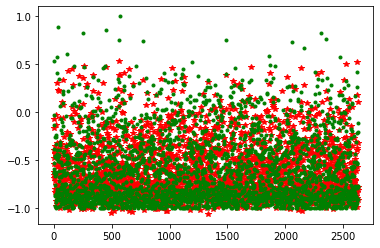

In [ ]:
plt.figure()
plt.plot(outputTest_A2_Nadam, '*r',y_test, '.g')

In [ ]:
for i in range(0,10) :
  outputTest_A2_Nadam_8pred =  modelA2_Nadam.predict(np.reshape(np.array(x_test)[i],(1,8)))  
  print(outputTest_A2_Nadam_8pred)

1/1 [==============================] - 0s 69ms/step
[[-0.3950063]]
1/1 [==============================] - 0s 31ms/step
[[-0.66005504]]
1/1 [==============================] - 0s 24ms/step
[[-0.54098415]]
1/1 [==============================] - 0s 24ms/step
[[-0.16227828]]
1/1 [==============================] - 0s 24ms/step
[[-0.69222283]]
1/1 [==============================] - 0s 27ms/step
[[-0.63120115]]
1/1 [==============================] - 0s 25ms/step
[[-0.07185809]]
1/1 [==============================] - 0s 27ms/step
[[-0.47591603]]
1/1 [==============================] - 0s 27ms/step
[[-0.6514832]]
1/1 [==============================] - 0s 27ms/step
[[-0.67788994]]


**Coeficiente de regresión**

(2628, 1)
(2628, 1)
Coeficiente:  0.7091170284720485


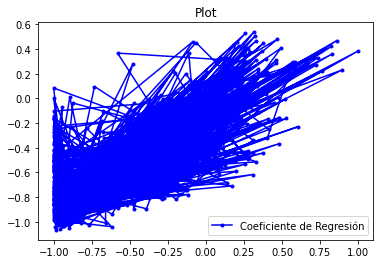

In [ ]:
from sklearn import linear_model

output = outputTest_A2_Nadam
target = y_test.reshape([2628,1])

print(output.shape)
print(target.shape)

regr = linear_model.LinearRegression()

regr.fit(target, output)

coef = regr.coef_

print('Coeficiente: ', coef[0][0])

plt.figure()
plt.plot(target,output, '.-b', label = 'Coeficiente de Regresión')
plt.title('Plot')
plt.legend()
plt.show()

###### Adamax

In [ ]:
history6 = modelA2_Adamax.fit(x_train,y_train, validation_data=(x_test,y_test), epochs=250, batch_size=100, verbose=0)

In [ ]:
score6 = modelA2_Adamax.evaluate(x_test, y_test, verbose=0)

print(score6)

0.04688284546136856


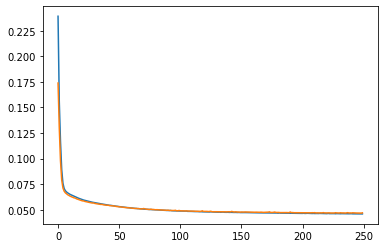

In [ ]:
plt.plot(history6.history['loss'])
plt.plot(history6.history['val_loss'])

In [ ]:
outputTest_A2_Adamax = modelA2_Adamax.predict(x_test)
print(outputTest_A2_Adamax.shape)

83/83 [==============================] - 0s 2ms/step
(2628, 1)


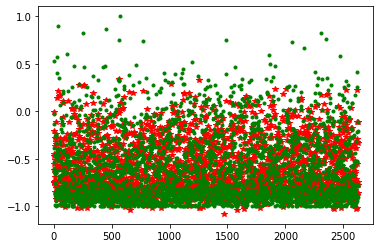

In [ ]:
plt.figure()
plt.plot(outputTest_A2_Adamax, '*r',y_test, '.g')

In [ ]:
for i in range(0,10) :
  outputTest_A2_Adamax_10pred =  modelA2_Adamax.predict(np.reshape(np.array(x_test)[i],(1,8)))  
  print(outputTest_A2_Adamax_10pred)

1/1 [==============================] - 0s 88ms/step
[[-0.46675202]]
1/1 [==============================] - 0s 25ms/step
[[-0.624059]]
1/1 [==============================] - 0s 22ms/step
[[-0.449788]]
1/1 [==============================] - 0s 33ms/step
[[-0.20727545]]
1/1 [==============================] - 0s 27ms/step
[[-0.7411248]]
1/1 [==============================] - 0s 26ms/step
[[-0.7558537]]
1/1 [==============================] - 0s 33ms/step
[[-0.01002099]]
1/1 [==============================] - 0s 28ms/step
[[-0.5574809]]
1/1 [==============================] - 0s 26ms/step
[[-0.5156885]]
1/1 [==============================] - 0s 25ms/step
[[-0.6937867]]


**Coeficiente de regresión**

(2628, 1)
(2628, 1)
Coeficiente:  0.6258859168750696


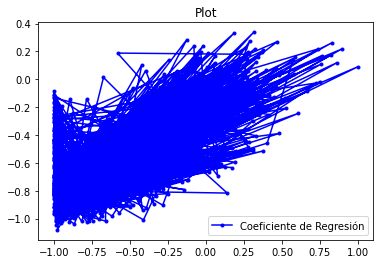

In [ ]:
from sklearn import linear_model

output = outputTest_A2_Adamax
target = y_test.reshape([2628,1])

print(output.shape)
print(target.shape)

regr = linear_model.LinearRegression()

regr.fit(target, output)

coef = regr.coef_

print('Coeficiente: ', coef[0][0])

plt.figure()
plt.plot(target,output, '.-b', label = 'Coeficiente de Regresión')
plt.title('Plot')
plt.legend()
plt.show()

###### Comparación

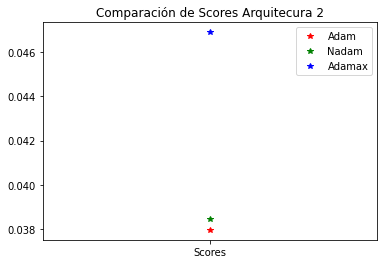

In [ ]:
plt.title('Comparación de Scores Arquitecura 2')
plt.plot("Scores",score4 ,'*r' ,label="Adam")
plt.plot("Scores",score5 ,'*g' ,label="Nadam")
plt.plot("Scores",score6 ,'*b',label="Adamax")
plt.legend()
plt.show()

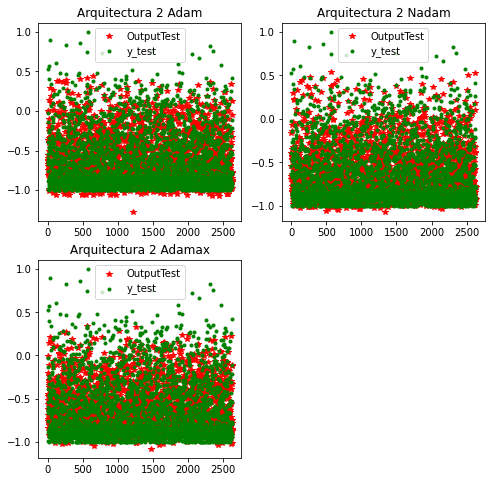

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 2, 1)

plt.title('Arquitectura 2 Adam')
plt.plot(outputTest_A2_Adam ,'*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(2, 2, 2)
plt.title('Arquitectura 2 Nadam')
plt.plot(outputTest_A2_Nadam, '*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(2, 2, 3)
plt.title('Arquitectura 2 Adamax')
plt.plot(outputTest_A2_Adamax, '*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

##### Tercera arquitectura

###### Adam

In [ ]:
history7 = modelA3_Adam.fit(x_train,y_train, validation_data=(x_test,y_test), epochs=250, batch_size=100, verbose=0)

In [ ]:
score7 = modelA3_Adam.evaluate(x_test, y_test, verbose=0)

print(score7)

0.034895069897174835


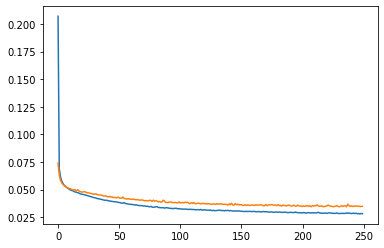

In [ ]:
plt.plot(history7.history['loss'])
plt.plot(history7.history['val_loss'])

In [ ]:
outputTest_A3_Adam = modelA3_Adam.predict(x_test)
print(outputTest_A3_Adam.shape)

83/83 [==============================] - 0s 2ms/step
(2628, 1)


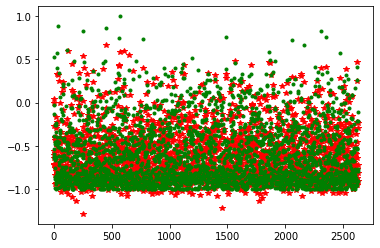

In [ ]:
plt.figure()
plt.plot(outputTest_A3_Adam, '*r',y_test, '.g')

In [ ]:
for i in range(0,10) :
  outputTest_A3_Adam_10pred =  modelA3_Adam.predict(np.reshape(np.array(x_test)[i],(1,8)))  
  print(outputTest_A3_Adam_10pred)

1/1 [==============================] - 0s 68ms/step
[[-0.27163002]]
1/1 [==============================] - 0s 25ms/step
[[-0.60798717]]
1/1 [==============================] - 0s 25ms/step
[[-0.6424886]]
1/1 [==============================] - 0s 27ms/step
[[0.04162571]]
1/1 [==============================] - 0s 27ms/step
[[-0.7251744]]
1/1 [==============================] - 0s 31ms/step
[[-0.5590906]]
1/1 [==============================] - 0s 25ms/step
[[-0.00150125]]
1/1 [==============================] - 0s 29ms/step
[[-0.7138636]]
1/1 [==============================] - 0s 29ms/step
[[-0.5841391]]
1/1 [==============================] - 0s 29ms/step
[[-0.70559883]]


**Coeficiente de regresión**

(2628, 1)
(2628, 1)
Coeficiente:  0.7395783889977946


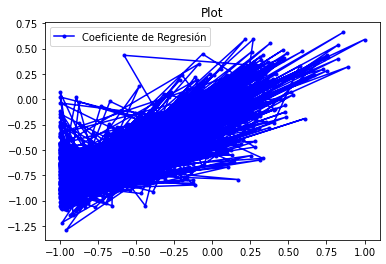

In [ ]:
from sklearn import linear_model

output = outputTest_A3_Adam
target = y_test.reshape([2628,1])

print(output.shape)
print(target.shape)

regr = linear_model.LinearRegression()

regr.fit(target, output)

coef = regr.coef_

print('Coeficiente: ', coef[0][0])

plt.figure()
plt.plot(target,output, '.-b', label = 'Coeficiente de Regresión')
plt.title('Plot')
plt.legend()
plt.show()

###### Nadam

In [ ]:
import datetime, os

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

In [ ]:
history8 = modelA3_Nadam.fit(x_train,y_train, validation_data=(x_test,y_test), epochs=250, batch_size=100, verbose=0, callbacks=[tensorboard_callback])

In [ ]:
score8 = modelA3_Nadam.evaluate(x_test, y_test, verbose=0)

print(score8)

0.03667498752474785


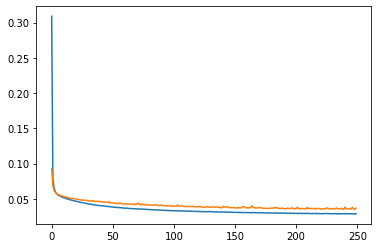

In [ ]:
plt.plot(history8.history['loss'])
plt.plot(history8.history['val_loss'])

In [ ]:
outputTest_A3_Nadam = modelA3_Nadam.predict(x_test)
print(outputTest_A3_Nadam.shape)

83/83 [==============================] - 0s 1ms/step
(2628, 1)


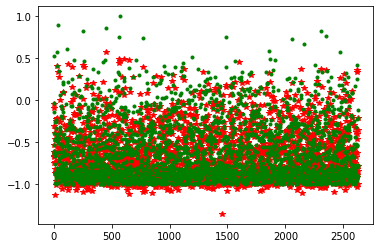

In [ ]:
plt.figure()
plt.plot(outputTest_A3_Nadam, '*r',y_test, '.g')

In [ ]:
for i in range(0,10) :
  outputTest_A3_Nadam_10pred =  modelA3_Nadam.predict(np.reshape(np.array(x_test)[i],(1,8)))  
  print(outputTest_A3_Nadam_10pred)

1/1 [==============================] - 0s 66ms/step
[[-0.31126502]]
1/1 [==============================] - 0s 26ms/step
[[-0.53860164]]
1/1 [==============================] - 0s 26ms/step
[[-0.6701338]]
1/1 [==============================] - 0s 28ms/step
[[-0.03916523]]
1/1 [==============================] - 0s 31ms/step
[[-0.74746084]]
1/1 [==============================] - 0s 33ms/step
[[-0.6201577]]
1/1 [==============================] - 0s 26ms/step
[[-0.09788853]]
1/1 [==============================] - 0s 26ms/step
[[-0.662374]]
1/1 [==============================] - 0s 26ms/step
[[-0.6450945]]
1/1 [==============================] - 0s 34ms/step
[[-0.7330028]]


**Coeficiente de regresión**

(2628, 1)
(2628, 1)
Coeficiente:  0.7503409103997086


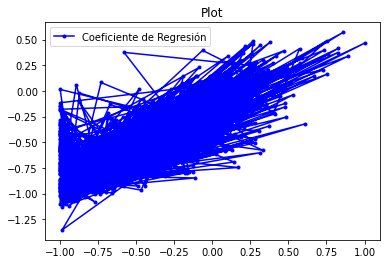

In [ ]:
from sklearn import linear_model

output = outputTest_A3_Nadam
target = y_test.reshape([2628,1])

print(output.shape)
print(target.shape)

regr = linear_model.LinearRegression()

regr.fit(target, output)

coef = regr.coef_

print('Coeficiente: ', coef[0][0])

plt.figure()
plt.plot(target,output, '.-b', label = 'Coeficiente de Regresión')
plt.title('Plot')
plt.legend()
plt.show()

###### Adamax

In [ ]:
history9 = modelA3_Adamax.fit(x_train,y_train, validation_data=(x_test,y_test), epochs=250, batch_size=100, verbose=0)

In [ ]:
score9 = modelA3_Adamax.evaluate(x_test, y_test, verbose=0)

print(score9)

0.037914860993623734


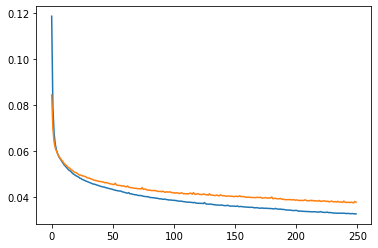

In [ ]:
plt.plot(history9.history['loss'])
plt.plot(history9.history['val_loss'])

In [ ]:
outputTest_A3_Adamax = modelA3_Adamax.predict(x_test)
print(outputTest_A3_Adamax.shape)

83/83 [==============================] - 0s 2ms/step
(2628, 1)


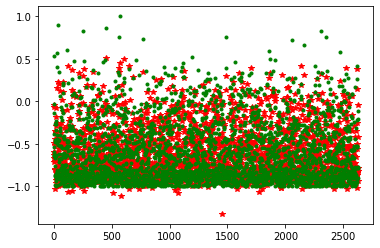

In [ ]:
plt.figure()
plt.plot(outputTest_A3_Adamax, '*r',y_test, '.g')

In [ ]:
for i in range(0,10) :
  outputTest_A3_Adamax_10pred =  modelA3_Adamax.predict(np.reshape(np.array(x_test)[i],(1,8)))  
  print(outputTest_A3_Adamax_10pred)

1/1 [==============================] - 0s 67ms/step
[[-0.48587966]]
1/1 [==============================] - 0s 28ms/step
[[-0.63077015]]
1/1 [==============================] - 0s 24ms/step
[[-0.60179096]]
1/1 [==============================] - 0s 29ms/step
[[-0.06960908]]
1/1 [==============================] - 0s 29ms/step
[[-0.7204751]]
1/1 [==============================] - 0s 25ms/step
[[-0.6002613]]
1/1 [==============================] - 0s 25ms/step
[[-0.04154842]]
1/1 [==============================] - 0s 25ms/step
[[-0.6709266]]
1/1 [==============================] - 0s 28ms/step
[[-0.699025]]
1/1 [==============================] - 0s 26ms/step
[[-0.68258536]]


**Coeficiente de regresión**

(2628, 1)
(2628, 1)
Coeficiente:  0.7206419220308526


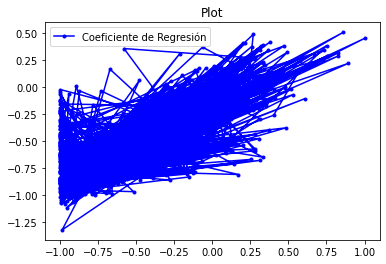

In [ ]:
from sklearn import linear_model

output = outputTest_A3_Adamax
target = y_test.reshape([2628,1])

print(output.shape)
print(target.shape)

regr = linear_model.LinearRegression()

regr.fit(target, output)

coef = regr.coef_

print('Coeficiente: ', coef[0][0])

plt.figure()
plt.plot(target,output, '.-b', label = 'Coeficiente de Regresión')
plt.title('Plot')
plt.legend()
plt.show()

###### Comparación

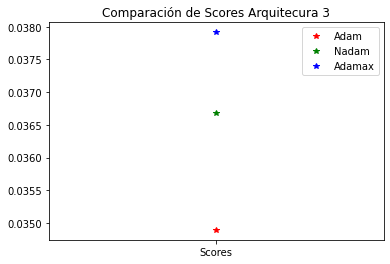

In [ ]:
plt.title('Comparación de Scores Arquitecura 3')
plt.plot("Scores",score7 ,'*r' ,label="Adam")
plt.plot("Scores",score8 ,'*g' ,label="Nadam")
plt.plot("Scores",score9 ,'*b',label="Adamax")
plt.legend()
plt.show()

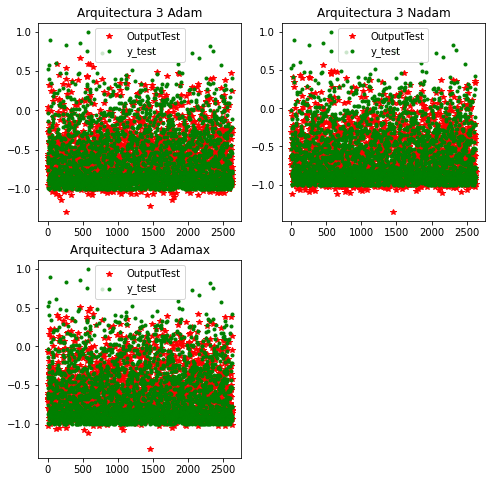

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 2, 1)

plt.title('Arquitectura 3 Adam')
plt.plot(outputTest_A3_Adam ,'*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(2, 2, 2)
plt.title('Arquitectura 3 Nadam')
plt.plot(outputTest_A3_Nadam, '*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(2, 2, 3)
plt.title('Arquitectura 3 Adamax')
plt.plot(outputTest_A3_Adamax, '*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

##### Comparación entre arquitecturas y optimizadores

<p align="justify">
 Se realiza una comparación entre las diferentes arquitecturas y optimizadores mediante las respuestas de las predicciones y el resultado de las funciones de perdida del entrenamiento y de la validación. Se observa que el optimizador Nadam presenta mejores resultados de forma generalizada sin importar la arquitectura, aunque se mantiene una proporción entre las arquitecturas mejores que otras. Las arquitecturas con optimizadores Adam presentan un comportamiento rígido en el cual las predicciones están en un bloque, generando una especie de línea horizontal, a diferencia de los optimizadores Adamax y Nadam, en los cuales se puede observar cómo los valores predichos presentan un comportamiento similar al de los datos reales.

La arquitectura que presenta mejores resultados corresponde a la arquitectura 3, debido a que presenta funciones de perdida mucho más cercanas a cero. Si se observan los coeficientes de regresión mencionados anteriormente, se tiene que la respuesta que presenta mayor cercanía a uno, con un 75%, es la del Nadam para la arquitectura 3. En resumen, se evidencia que el optimizador Nadam es el mejor de los tres implementados y la arquitectura 3 es la que presenta los mejores resultados.
  </font>
<p>

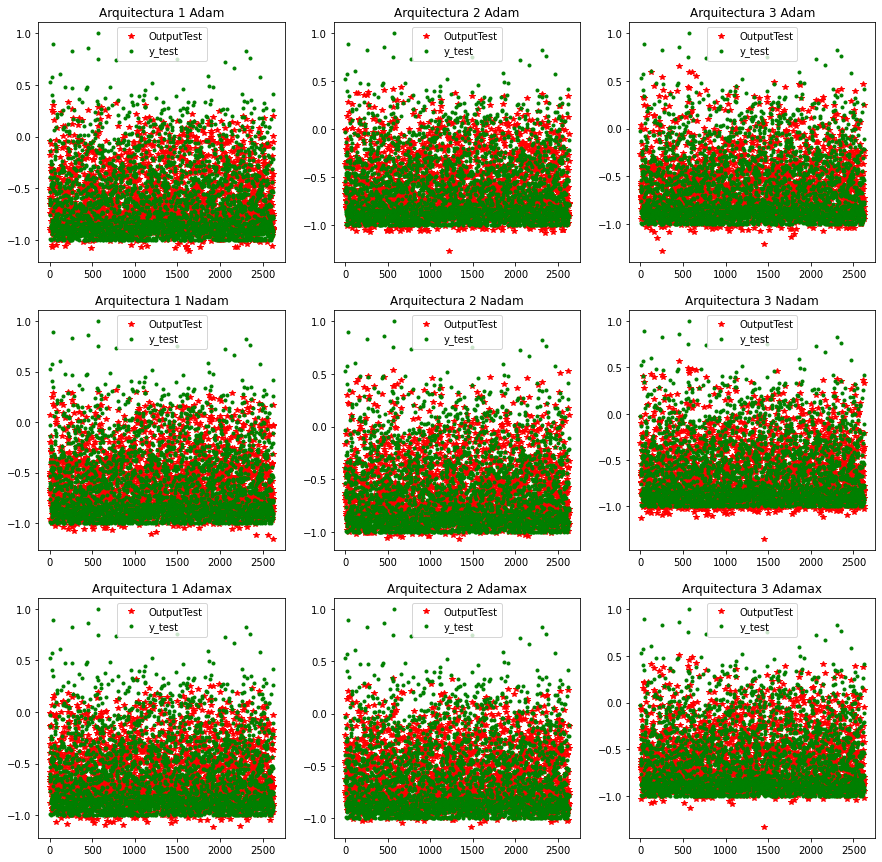

In [ ]:
plt.figure(figsize=(15, 15))

plt.subplot(3, 3, 1)
plt.title('Arquitectura 1 Adam')
plt.plot(outputTest_A1_Adam ,'*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(3, 3, 2)
plt.title('Arquitectura 2 Adam')
plt.plot(outputTest_A2_Adam ,'*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(3, 3, 3)
plt.title('Arquitectura 3 Adam')
plt.plot(outputTest_A3_Adam ,'*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(3, 3, 4)
plt.title('Arquitectura 1 Nadam')
plt.plot(outputTest_A1_Nadam, '*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(3, 3, 5)
plt.title('Arquitectura 2 Nadam')
plt.plot(outputTest_A2_Nadam, '*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(3, 3, 6)
plt.title('Arquitectura 3 Nadam')
plt.plot(outputTest_A3_Nadam, '*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(3, 3, 7)
plt.title('Arquitectura 1 Adamax')
plt.plot(outputTest_A1_Adamax, '*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(3, 3, 8)
plt.title('Arquitectura 2 Adamax')
plt.plot(outputTest_A2_Adamax, '*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()

plt.subplot(3, 3, 9)
plt.title('Arquitectura 3 Adamax')
plt.plot(outputTest_A3_Adamax, '*r' ,label='OutputTest')
plt.plot(y_test, '.g' ,label='y_test')
plt.legend()






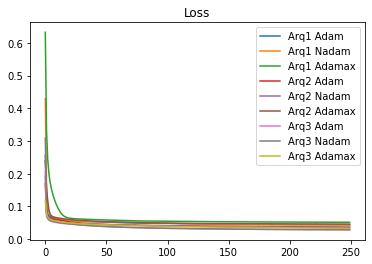

In [ ]:
plt.title('Loss')
plt.plot(history1.history['loss'], label="Arq1 Adam")
plt.plot(history2.history['loss'], label="Arq1 Nadam")
plt.plot(history3.history['loss'], label="Arq1 Adamax")
plt.plot(history4.history['loss'], label="Arq2 Adam")
plt.plot(history5.history['loss'], label="Arq2 Nadam")
plt.plot(history6.history['loss'], label="Arq2 Adamax")
plt.plot(history7.history['loss'], label="Arq3 Adam")
plt.plot(history8.history['loss'], label="Arq3 Nadam")
plt.plot(history9.history['loss'], label="Arq3 Adamax")
plt.legend()

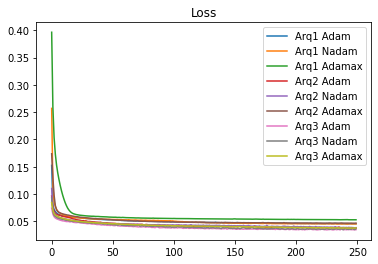

In [ ]:
plt.title('Loss')
plt.plot(history1.history['val_loss'], label="Arq1 Adam")
plt.plot(history2.history['val_loss'], label="Arq1 Nadam")
plt.plot(history3.history['val_loss'], label="Arq1 Adamax")
plt.plot(history4.history['val_loss'], label="Arq2 Adam")
plt.plot(history5.history['val_loss'], label="Arq2 Nadam")
plt.plot(history6.history['val_loss'], label="Arq2 Adamax")
plt.plot(history7.history['val_loss'], label="Arq3 Adam")
plt.plot(history8.history['val_loss'], label="Arq3 Nadam")
plt.plot(history9.history['val_loss'], label="Arq3 Adamax")
plt.legend()

#### Guardar el modelo

Se guarda el modelo entrenado, sin embargo, no se realiza con el modelo de mejores resultados (tercera arquitectura) esto, debido a que si se espera realizar una implementación en Arduino, se cuenta con capacidades minimas para el computo de las matrices. 

In [ ]:
weigths_and_bias_A1_Nadam = modelA1_Nadam.get_weights()
print(np.array(weigths_and_bias_A1_Nadam).shape)
print(weigths_and_bias_A1_Nadam)

(4,)
[array([[ 0.15369269,  1.2025405 , -1.5895532 , -0.9379399 ,  0.01284913,
         1.1240828 , -0.08674003,  0.4220387 , -0.74370533,  0.19479065],
       [ 0.3312562 , -0.225507  ,  0.13333608,  0.03146402, -0.43376505,
        -0.6761673 , -0.61752754, -0.7406621 ,  0.67488146, -0.0470287 ],
       [ 1.4267931 ,  0.04902516,  0.25250763, -0.1942246 ,  0.46243975,
         0.32052124, -0.27852643,  0.44058576,  0.3067462 ,  0.47550586],
       [ 0.48202458,  0.03255267, -0.16203707, -0.15585914, -0.5209553 ,
         0.02109032,  0.31043944, -0.05053395,  0.0655808 , -0.25878924],
       [-0.04291498, -0.07565843, -0.02767957, -0.17415945, -0.00680515,
        -0.13230047, -0.03518743, -0.02474852,  0.0827681 ,  0.09739551],
       [-0.40615246,  0.10837542,  0.5014229 ,  0.48989156, -0.47540686,
        -0.42832443,  0.17185695, -0.7445681 ,  0.43165722, -0.49912205],
       [ 0.14495648, -0.47980785,  0.11747295,  0.17208055, -0.34646627,
         0.26043203, -0.02614462,  0.10

<ipython-input-115-2ce75dfa5c7f>:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  print(np.array(weigths_and_bias_A1_Nadam).shape)


In [ ]:
x_test.head(10)

,hour,temperature,humidity,wind speed,visibility,dew point temperature,solar radiation,seasons
6056,-0.304348,0.573427,0.408163,-0.513514,0.998986,0.785467,-0.602273,0.333333
5556,0.043478,0.762238,0.040816,-0.432432,-0.216422,0.788927,0.823864,0.333333
5990,0.217391,0.811189,0.020408,-0.675676,0.740497,0.823529,-0.045455,0.333333
7674,0.565217,0.213287,-0.040816,-0.621622,0.632032,0.249135,-0.937500,1.000000
3319,-0.391304,-0.153846,0.040816,-0.729730,0.389762,-0.044983,-0.892045,-0.333333
5761,-0.913043,0.601399,0.448980,-0.837838,0.796249,0.826990,-1.000000,0.333333
5972,0.739130,0.716783,0.326531,-0.459459,0.580335,0.885813,-0.988636,0.333333
8758,0.913043,-0.304196,-0.163265,-0.729730,0.857070,-0.280277,-1.000000,1.000000
6079,-0.391304,0.555944,0.367347,-0.783784,1.000000,0.750865,-0.926136,0.333333
7177,-0.913043,0.202797,0.081633,-0.540541,1.000000,0.297578,-1.000000,1.000000


In [ ]:
%load_ext tensorboard
%tensorboard --logdir {'./logs'}

Output hidden; open in https://colab.research.google.com to view.